# Анализ рынка заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Заказчики попросили для начала подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Основатели фонда «Shut Up and Take My Money» в качестве возможного варианта рассматривают отрытие кофейни в Москве. Заказчики не боятся конкуренции в этой сфере, несмотря на то, что кофеен в больших городах уже достаточно. Необходимо проанализировать, насколько осуществима задумка клиентов.

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Файл `moscow_places.csv`:

`name` — название заведения;

`address` — адрес заведения;

`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;

`hours` — информация о днях и часах работы;

`lat` — широта географической точки, в которой находится заведение;

`lng` — долгота географической точки, в которой находится заведение;

`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:

* «Средний счёт: 1000–1500 ₽»;

* «Цена чашки капучино: 130–220 ₽»;

* «Цена бокала пива: 400–600 ₽».

* и так далее;

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт».

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино». Для `middle_avg_bill` и `middle_coffee_cup`:

* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

* Если значения нет или оно не начинается с подстроки «Средний счёт»/«Цена одной чашки капучино», то в столбец ничего не войдёт.


`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

* 0 — заведение не является сетевым

* 1 — заведение является сетевым

`district` — административный район, в котором находится заведение, например Центральный административный округ;

`seats` — количество посадочных мест.

**План исследования**:

1. Изучение данных;

2. Предобработка данных;

3. Анализ данных;

4. Детализируем исследование: открытие кофейни;

5. Общий вывод;

6. Подготовка презентации.


### Изучение данных

In [1]:
#загружаем необходимые библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from folium import Map, Choropleth, Marker
import json
from folium.plugins import MarkerCluster
from plotly import graph_objects as go
import warnings
warnings.filterwarnings('ignore')

In [2]:
#сохраняем в переменную data датафрейм moscow_places
data = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
#напишем функцию, с помощью которой выведем основную информацию о файле
def data_inf(df):
    print(f'Первые строки таблицы:')
    print('*'*20)
    display(df.head())
    print(f'Информация о таблице:')
    print('*'*20)
    df.info()
    print(f'Количество дубликатов:')
    print('*'*20)
    for name, values in df.iteritems():
        print(name, values.duplicated().sum()) 
    print(f'Количество уникальных записей в каждом столбце:')
    print('*'*20)
    for name, values in df.iteritems():
        print(name, values.nunique())

In [4]:
#применяем функцию к датафрейму data
data_inf(data)

Первые строки таблицы:
********************


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Информация о таблице:
********************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
Количество дублика

Названия стоблцов обозначены верно. Есть пропуски в столбцах: `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`. Тип данных везде указан верно. Дубликаты обнаружены во всех столбцах, их можно оставить, т.к. они не влияют на дальнейший анализ данных.

### Предобработка данных

Пропуски в таких столбцах, как `hours`, `avg_bill`, `price`, `middle_coffee_cup` и `seats` нельзя заполнить логически, поэтому оставим их как есть, чтобы не исказить данные.

In [5]:
#создадим копию исходного датафрейма
old_data = data.copy()

In [6]:
#проверим данные на аномалии
data[['middle_avg_bill', 'middle_coffee_cup', 'seats', 'rating']].describe()

,middle_avg_bill,middle_coffee_cup,seats,rating
count,3149.000000,535.000000,4795.000000,8406.000000
mean,958.053668,174.721495,108.421689,4.229895
std,1009.732845,88.951103,122.833396,0.470348
min,0.000000,60.000000,0.000000,1.000000
25%,375.000000,124.500000,40.000000,4.100000
50%,750.000000,169.000000,75.000000,4.300000
75%,1250.000000,225.000000,140.000000,4.400000
max,35000.000000,1568.000000,1288.000000,5.000000


Минимальный средний чек составил 0 рублей, что по сути и является аномалией. Максимальная средняя стоимость чашки капучино составила 1568 рублей, что также маловероятно. Кол-во мест варьируется от 0 до 1288. Самый низкий рейтинг заведения - 1 ед. При этом у больше, чем половины заведений, рейтинг превышает 4 ед.

Посмотрим более подробнее аномалии `middle_avg_bill`, `middle_coffee_cup`. Построим гистограммы и ящики с усами.

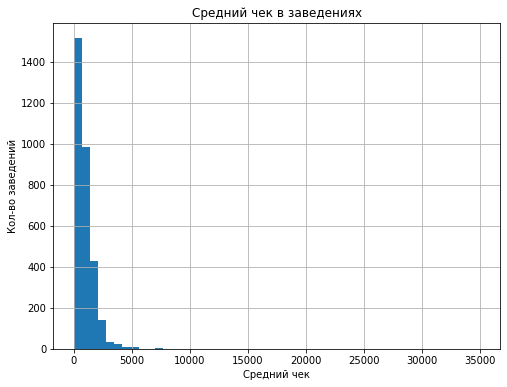

In [7]:
#построим гистограмму распределения среднего чека
plt.figure(figsize=(8, 6))
plt.hist(data['middle_avg_bill'], bins=50)
plt.title('Средний чек в заведениях')
plt.xlabel('Средний чек')
plt.ylabel('Кол-во заведений')
plt.grid()
plt.show()

Выбросы есть, средний чек лежит в пределах 5000 рублей.

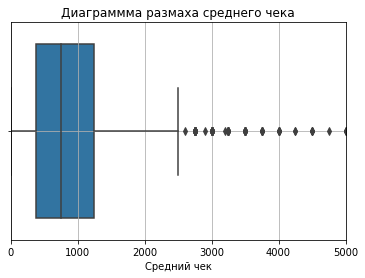

In [8]:
#построим ящик с усами для middle_avg_bill
plt.figure()
sns.boxplot(x='middle_avg_bill', data=data)
plt.title('Диаграммма размаха среднего чека')
plt.xlabel('Средний чек')
plt.grid()
plt.xlim([0, 5000])
plt.show()

Выбросами являются средние чеки, превышающие стоимость в 2500 рублей.

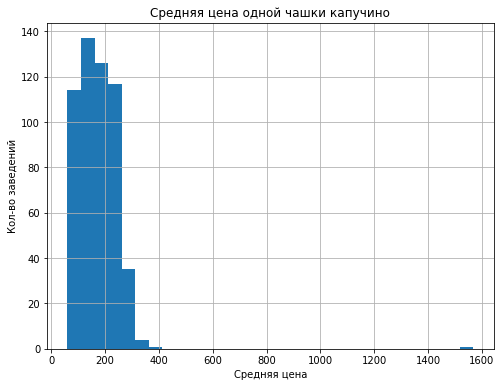

In [9]:
#построим гистограмму распределения среднего чека
plt.figure(figsize=(8, 6))
plt.hist(data['middle_coffee_cup'], bins=30)
plt.title('Средняя цена одной чашки капучино')
plt.xlabel('Средняя цена')
plt.ylabel('Кол-во заведений')
plt.grid()
plt.show()

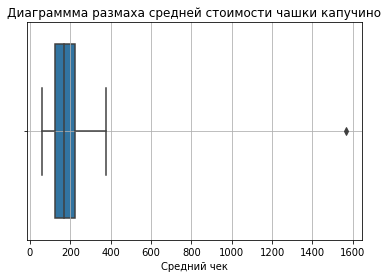

In [10]:
#построим ящик с усами для middle_coffee_cup
plt.figure()
sns.boxplot(x='middle_coffee_cup', data=data)
plt.title('Диаграммма размаха средней стоимости чашки капучино')
plt.xlabel('Средний чек')
plt.grid()
plt.show()

Действительно максимальная средняя стоимость чашки капучино, что составила 1568 рублей, является выбросом.

Перед устраненим выбросов в `middle_avg_bill` проверим сначала, какую долю составляют данные о заведениях, в которых средний чек составляет больше 2500 рублей.

In [11]:
anomaly = len(data[data['middle_avg_bill'] >= 2500]) / len(data)
print(f'Информация о заведениях, в которых средний чек составляет больше 2500 рублей, составляет {anomaly:.1%} данных')

Информация о заведениях, в которых средний чек составляет больше 2500 рублей, составляет 1.8% данных


Аномалии составляют 1.8%, их можно удалить без больших потерь данных.

In [12]:
#устраним аномалии в данных 
#заполним пропуски в middle_avg_bill на -1, чтобы сделать срез без выбросов
data['middle_avg_bill'] = data['middle_avg_bill'].fillna(-1)
data = data.query('middle_avg_bill != 0 and middle_coffee_cup != 1568 and middle_avg_bill <= 2500')
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8300 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8300 non-null   object 
 1   category           8300 non-null   object 
 2   address            8300 non-null   object 
 3   district           8300 non-null   object 
 4   hours              7764 non-null   object 
 5   lat                8300 non-null   float64
 6   lng                8300 non-null   float64
 7   rating             8300 non-null   float64
 8   price              3212 non-null   object 
 9   avg_bill           3710 non-null   object 
 10  middle_avg_bill    8300 non-null   float64
 11  middle_coffee_cup  534 non-null    float64
 12  chain              8300 non-null   int64  
 13  seats              4723 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 972.7+ KB


In [13]:
#посчитаем долю оставшихся данных после удаления выбросов и сохраним в переменную new_data
new_data = len(data) / len(old_data)

print(f'После устранения выбросов от исходного датафрейма осталось {new_data:.1%} данных')

После устранения выбросов от исходного датафрейма осталось 98.7% данных


Создадим столбец `street` с названиями улиц из столбца с адресом.

In [14]:
data['street'] = data['address'].str.split(', ').str[1]
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,-1.0,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,-1.0,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


Создадим столбец `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

* логическое значение True — если заведение работает ежедневно и круглосуточно;

* логическое значение False — в противоположном случае.

In [15]:
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,-1.0,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,-1.0,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


Столбцы с пропусками были оставлены как есть, чтобы не исказить результаты дальнейшего анализа. Аномалии в столбцах `middle_avg_bill` и `middle_coffee_cup` устранены настолько, насколько это возможно. В исходный датафрем добавлены столбцы `street` с названиями улиц и `is_24_7` с информацией о том, работает ли заведение круглосуточно или нет.

### Анализ данных

#### Категории заведений  в данных

In [16]:
#посчитаем кол-во уникальных заведений каждой категории
data['category'].value_counts().reset_index()

,index,category
0,кафе,2373
1,ресторан,1964
2,кофейня,1411
3,"бар,паб",753
4,пиццерия,629
5,быстрое питание,600
6,столовая,314
7,булочная,256


In [17]:
#создадим датафрейм, в котором будут отображены уникальные категории заведений и частота их встречаемости в данных 
category = data['category'].value_counts().reset_index()
category = category.rename(columns={'index':'Категория', 'category':'Кол-во заведений'})

#построим столбчатую диаграмму
plt.figure(figsize=(10, 8))
fig = px.bar(category,x='Категория', y='Кол-во заведений', title='Распределение заведений по категориям', color='Категория', \
             text='Кол-во заведений', color_discrete_map={'кафе':'#74b9ff', 'ресторан':'#81ecec', 'кофейня':'#00b894', 'бар,паб':'#ff7675', \
                        'пиццерия':'#fdcb6e', 'быстрое питание':'#d63031', 'столовая':'#2d3436', 'булочная':'#e84393'})

fig.show()

<Figure size 720x576 with 0 Axes>

Всего в данных 8 категорий заведений, которые распределены следующим образом: 

1. Кафе (2373 заведений).

2. Ресторан (1964).

3. Кофейня (1411).

4. Бар, паб (753).

5. Пиццерия (629).

6. Быстрое питание (600).

7. Столовая (314).

8. Булочная (256).

Больше всего кафе, ресторанов и кофеен. Менее всего распространены столовые и булочные.

#### Количество посадочных мест в местах по категориям

In [18]:
#сгруппируем данные по категориям и кол-ву посадочных мест
cat_seats = data.groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False)
cat_seats = cat_seats.rename(columns={'category':'Категория', 'seats':'Медианное кол-во посадочных мест'})
cat_seats

,Категория,Медианное кол-во посадочных мест
6,ресторан,85.0
0,"бар,паб",82.0
4,кофейня,80.0
7,столовая,75.0
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


In [19]:
#построим столбчатую диаграмму
plt.figure(figsize=(10, 8))
fig = px.bar(cat_seats, x='Категория', y='Медианное кол-во посадочных мест', title='Распределение заведений по среднему кол-ву посадочных мест', color='Категория', \
             text='Медианное кол-во посадочных мест', color_discrete_map={'кафе':'#74b9ff', 'ресторан':'#81ecec', 'кофейня':'#00b894', 'бар,паб':'#ff7675', \
                        'пиццерия':'#fdcb6e', 'быстрое питание':'#d63031', 'столовая':'#2d3436', 'булочная':'#e84393'})

fig.show()

<Figure size 720x576 with 0 Axes>

Больше всего посадочных мест у ресторанов, баров/пабов и кофеен. Меньше всего их у пиццерий и булочных.

#### Соотношение сетевых и несетевых заведений в датасете

In [20]:
#создадим датафрейм, в котором будут подсчитаны сетевые и несетевые заведения
chain = data['chain'].value_counts().reset_index()
chain['chain'] = chain['chain'].round()

#построим круговую диаграмму соотношения сетевых и несетевых заведений
fig = go.Figure(data=[go.Pie(labels=chain['index'], values=chain['chain'])])
fig.update_layout(title='Соотношение сетевых и несетевых заведений') 
fig.show()

Несетевых заведений в данных значительно больше, чем сетевых.

#### Какие категории заведений чаще являются сетевыми?

In [21]:
#сделаем срез заведений, которые являются сетевыми
chain_cat = data.query('chain == 1')
chain_cat_total = data.groupby('category')['chain'].count().reset_index().sort_values(by='chain', ascending=False)

#сгруппируем полученные данные
chain_fac = chain_cat.groupby('category')['chain'].count().reset_index().sort_values(by='chain', ascending=False)
chain_fac['Доля'] = round(chain_fac['chain'] / chain_cat_total['chain'] * 100, 2)
chain_fac = chain_fac.sort_values(by='Доля', ascending=False)
chain_fac = chain_fac.rename(columns=({'category':'Категория', 'chain':'Кол-во сетевых'}))
chain_fac

,Категория,Кол-во сетевых,Доля
1,булочная,157,61.33
5,пиццерия,329,52.31
4,кофейня,718,50.89
2,быстрое питание,230,38.33
6,ресторан,725,36.91
3,кафе,779,32.83
7,столовая,88,28.03
0,"бар,паб",168,22.31


In [22]:
#построим столбчатую диаграмму
plt.figure(figsize=(10, 8))
fig = px.bar(chain_fac, x='Категория', y='Доля', title='% сетевых от общего количества заведений каждой категории', color='Категория', \
             text='Доля', color_discrete_map={'кафе':'#74b9ff', 'ресторан':'#81ecec', 'кофейня':'#00b894', 'бар,паб':'#ff7675', \
                        'пиццерия':'#fdcb6e', 'быстрое питание':'#d63031', 'столовая':'#2d3436', 'булочная':'#e84393'})

fig.show()

<Figure size 720x576 with 0 Axes>

Чаще всего сетевыми являются заведения категорий: **булочная, пиццерия и кофейня**. Меньше всего сетевых заведений наблюдается среди столовых и баров/пабов.

#### Топ-15 популярных сетей в Москве

In [23]:
#выведем топ-15 популярных сетей в Москве из среза chain_cat
top_15 = chain_cat.groupby('name')['category'].count()\
                            .sort_values(ascending=False).reset_index().head(15)

#переименуем столбцы
top_15 = top_15.rename(columns={'name':'Название сети', 'category':'Кол-во заведений',})

#добавим информацию о категориях заведений
top_15['Категория'] = data['category']

#построим столбчатую диаграмму
plt.figure(figsize=(10, 8))
fig = px.bar(top_15, x='Название сети', y='Кол-во заведений', title='Топ-15 сетевых заведений', text='Кол-во заведений')

fig.show()

<Figure size 720x576 with 0 Axes>

In [24]:
#посмотрим, какие категории у тех заведений, что вошли в топ 15 самых популярных заведений Москвы
top_15 = top_15.groupby('Категория')['Кол-во заведений'].sum().reset_index()
top_15['Доля'] = round(top_15['Кол-во заведений'] / top_15['Кол-во заведений'].sum() * 100, 2)
top_15 = top_15.sort_values(by='Доля', ascending=False)
top_15

,Категория,Кол-во заведений,Доля
3,кафе,301,36.93
5,пиццерия,134,16.44
6,ресторан,118,14.48
0,"бар,паб",115,14.11
4,кофейня,71,8.71
2,быстрое питание,44,5.40
1,булочная,32,3.93


In [25]:
#построим столбчатую диаграмму
plt.figure(figsize=(10, 8))
fig = px.bar(top_15, x='Категория', y='Доля', title='% категорий популярных сетей', color='Категория', \
             text='Доля', color_discrete_map={'кафе':'#74b9ff', 'ресторан':'#81ecec', 'кофейня':'#00b894', 'бар,паб':'#ff7675',\
                        'пиццерия':'#fdcb6e', 'быстрое питание':'#d63031', 'столовая':'#2d3436', 'булочная':'#e84393'})

fig.show()

<Figure size 720x576 with 0 Axes>

Из топа 15 самых популярных сетей в Москве наибольшей популярностью пользуются: **Шоколадница, Домино'c Пицца** и **Додо Пицца**. Категории этого топа распределились следующим образом:

1. Кафе (36.93%).

2. Пиццерия (16.44%).

3. Ресторан (14.48%).

4. Бар/паб (14.11%).

5. Кофейня (8.71%).

6. Быстрое питание (5.4%)

7. Булочная (3.93%)

#### Какие административные районы Москвы присутствуют в датасете? 

In [27]:
#сделаем сводную таблицу, в которой будет отображено распределение кол-ва заведений в зависимости от их категории
#и административного округа, в котором они расположены
district_pivot = data.pivot_table(index=['district', 'category'], values='address', aggfunc='count')

#добавим столбец с долей категорий для каждого АО
district_pivot['ratio'] = round(district_pivot['address'] / district_pivot.groupby('district')['address'].sum() * 100, 2)

#сбросим индексы
district_pivot = district_pivot.reset_index()
#переименуем столбцы
district_pivot = district_pivot.rename(columns={'district':'Административный округ', 'category':'Категория', 'ratio':'Доля'})
district_pivot

,Административный округ,Категория,address,Доля
0,Восточный административный округ,"бар,паб",53,6.68
1,Восточный административный округ,булочная,25,3.15
2,Восточный административный округ,быстрое питание,70,8.82
3,Восточный административный округ,кафе,272,34.26
4,Восточный административный округ,кофейня,104,13.10
...,...,...,...,...
67,Южный административный округ,кафе,264,29.73
68,Южный административный округ,кофейня,131,14.75
69,Южный административный округ,пиццерия,73,8.22
70,Южный административный округ,ресторан,198,22.30


In [28]:
#построим столбчатый график
fig = px.bar(district_pivot, x='Доля', y='Административный округ', color='Категория', text='Доля',\
             title='Доля заведений каждой категории в зависимости от административного округа',\
             color_discrete_map={'кафе':'#74b9ff', 'ресторан':'#81ecec', 'кофейня':'#00b894', 'бар,паб':'#ff7675',\
                        'пиццерия':'#fdcb6e', 'быстрое питание':'#d63031', 'столовая':'#2d3436', 'булочная':'#e84393'})
fig.show()

В датасете присутствуют **9 административных округов**. Можно отметить, что в каждом округе популярны кафе, кофейни и рестораны. В Центральном округе также очень популярны бары и пабы. 

#### Распределение средних рейтингов по категориям заведений

In [29]:
#сгруппируем заведения по категориям и посмотрим их средний рейтинг
rating_cat = round(data.groupby('category')['rating'].mean(), 2).reset_index().sort_values(by='rating', ascending=False)
rating_cat = rating_cat.rename(columns={'category':'Категория', 'rating':'Рейтинг'})
rating_cat

,Категория,Рейтинг
0,"бар,паб",4.39
5,пиццерия,4.30
4,кофейня,4.28
6,ресторан,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [30]:
#построим столбчатую диаграмму
plt.figure(figsize=(10, 8))
fig = px.bar(rating_cat, x='Категория', y='Рейтинг', title='Распределение средних рейтингов заведений по категориям',\
             color='Категория',\
             text='Рейтинг', color_discrete_map={'кафе':'#74b9ff', 'ресторан':'#81ecec', 'кофейня':'#00b894', 'бар,паб':'#ff7675',\
                        'пиццерия':'#fdcb6e', 'быстрое питание':'#d63031', 'столовая':'#2d3436', 'булочная':'#e84393'})

fig.show()

<Figure size 720x576 with 0 Axes>

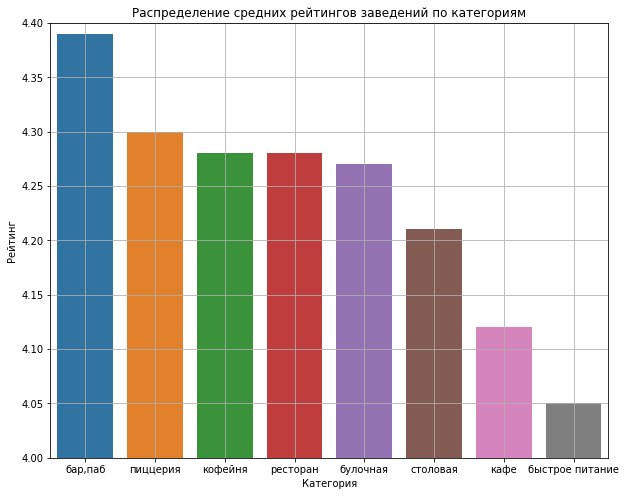

In [31]:
#увеличим масштаб столбчатой диаграммы
plt.figure(figsize=(10, 8))
sns.barplot(data=rating_cat, x='Категория', y='Рейтинг')
plt.title('Распределение средних рейтингов заведений по категориям')
plt.ylim(4, 4.4)
plt.grid()
plt.show()

Усреднённые рейтинги не сильно различаются в разных типах общепита. Выше всего рейтинг у баров и пабов, ниже всего - у заведений быстрого питания.

#### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [32]:
#посчитаем средние рейтинги заведений каждого округа
dis_rat = round(data.groupby('district')['rating'].mean().reset_index(), 2).sort_values(by='rating', ascending=False)
dis_rat

,district,rating
5,Центральный административный округ,4.37
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [33]:
#читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

#загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
#moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, titles='Карта дистриктов')

#создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dis_rat,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlOrBr',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по округам',
).add_to(m)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Самый высокий рейтинг заведений у Центрального АО, в то время как самый низкий у Юго-Восточного АО.

#### Топ-15 улиц по количеству заведений

In [34]:
#сделаем сводную таблицу, в которой будет отображено распределение кол-во заведений в зависимости от их категории
#и административного округа, в котором они расположены
street = data.pivot_table(index='street', values='name', columns='category', aggfunc='count', fill_value=0, margins=True)\
                                                            .sort_values(by='All', ascending=False).reset_index().head(16)
street

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All
0,All,753,256,600,2373,1411,629,1964,314,8300
1,проспект Мира,12,4,21,52,36,11,43,2,181
2,Профсоюзная улица,6,4,15,35,18,15,26,3,122
3,проспект Вернадского,7,1,12,25,16,12,33,2,108
4,Ленинский проспект,10,3,2,26,23,5,32,5,106
5,Ленинградский проспект,15,4,2,11,25,9,22,3,91
6,Дмитровское шоссе,5,2,10,23,11,8,24,4,87
7,Варшавское шоссе,6,0,7,18,14,4,20,7,76
8,Каширское шоссе,2,0,10,20,16,5,18,5,76
9,Ленинградское шоссе,5,2,5,13,13,3,23,3,67


In [35]:
#создадим еще 1 сводную таблицу, в которой категории будут индексами и в которой будет подсчитано кол-во заведений
#каждой категории в зависимости от улицы расположения
group_street = data.pivot_table(index=['street', 'category'], values='name', aggfunc='count', fill_value=0).reset_index()
group_street

,street,category,name
0,1-й Автозаводский проезд,кафе,1
1,1-й Балтийский переулок,ресторан,1
2,1-й Варшавский проезд,кафе,1
3,1-й Вешняковский проезд,кафе,1
4,1-й Волоколамский проезд,кафе,1
...,...,...,...
3791,шоссе Энтузиастов,кафе,10
3792,шоссе Энтузиастов,кофейня,7
3793,шоссе Энтузиастов,пиццерия,2
3794,шоссе Энтузиастов,ресторан,6


In [36]:
#объединим 2 сводные таблицы
street = street.merge(group_street, on='street', how='left')

#удалим строку All
street = street[street['street'] != 'All']
#переименуем столбцы
street = street.rename(columns={'street':'Улица', 'name':'Кол-во заведений', 'category':'Категория'})
street

,Улица,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,All,Категория,Кол-во заведений
1,проспект Мира,12,4,21,52,36,11,43,2,181,"бар,паб",12.0
2,проспект Мира,12,4,21,52,36,11,43,2,181,булочная,4.0
3,проспект Мира,12,4,21,52,36,11,43,2,181,быстрое питание,21.0
4,проспект Мира,12,4,21,52,36,11,43,2,181,кафе,52.0
5,проспект Мира,12,4,21,52,36,11,43,2,181,кофейня,36.0
...,...,...,...,...,...,...,...,...,...,...,...,...
107,Пятницкая улица,9,3,2,7,6,3,17,0,47,быстрое питание,2.0
108,Пятницкая улица,9,3,2,7,6,3,17,0,47,кафе,7.0
109,Пятницкая улица,9,3,2,7,6,3,17,0,47,кофейня,6.0
110,Пятницкая улица,9,3,2,7,6,3,17,0,47,пиццерия,3.0


In [37]:
#построим столбачтую диаграмму
fig = px.bar(street, x='Кол-во заведений', y='Улица', color='Категория', text='Кол-во заведений',\
             title='Кол-во заведений каждой категории в зависимости от улицы расположения',\
             color_discrete_map={'кафе':'#74b9ff', 'ресторан':'#81ecec', 'кофейня':'#00b894', 'бар,паб':'#ff7675',\
                        'пиццерия':'#fdcb6e', 'быстрое питание':'#d63031', 'столовая':'#2d3436', 'булочная':'#e84393'})
fig.show()

Меньше всего заведений расположено на Пятницкой улице, больше всего - на проспекте Мира, Профсоюзной улице, на проспекте Вернадского и Ленинском проспекте.

#### Улицы, на которых находится только один объект общепита

In [38]:
#сгруппируем данные по названию улиц и посчитаем сколько заведений расположено на каждой улице
street_rating = data.groupby('street')['name'].count().sort_values().reset_index()

#отберем только те улицы, на которых находится только 1 заведение
street_rating = street_rating.query('name == 1')
print('Количество улиц, на которых находится только 1 объект общепита:', len(street_rating))

Количество улиц, на которых находится только 1 объект общепита: 458


In [39]:
#оставим в street_rating только нужные нам улицы
street_rating = street_rating['street']

#построим хороплет с расположением улиц с единственным заведением и расположение самого заведения
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)
data.query('street in @street_rating').apply(create_clusters, axis=1)
m 


Улицы, на которых находится только один объект общепита зачастую весьма короткие по протяженности. Заведения на этих улицах расположены на окраинах районов или в переулках.

#### Фоновая картограмма (хороплет) ценового индикатора каждого района

In [40]:
#посчитаем медиану среднего чека для каждого района
district_bill = data.query('middle_avg_bill > 0').groupby('district')['middle_avg_bill'].median()\
                                                .reset_index().sort_values(by='middle_avg_bill', ascending=False)
district_bill

,district,middle_avg_bill
5,Центральный административный округ,1000.0
1,Западный административный округ,850.0
4,Северо-Западный административный округ,675.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,434.0


In [41]:
#построим хороплет с расположением этих заведений
#читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

#загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
#moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#создаём карту Москвы
bill_m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, titles='Карта улиц')

#создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuBuGn',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по округам',
).add_to(bill_m)

#выводим карту
bill_m

Как и ожидалось, самый большой чек выходит в Центральном АО (1000 рублей). Самый маленький чек - в Юго-Восточном АО. Важно отметить, что доля заведений в каждом округе довольно сильно разнится, а это может оказывать влияние на величину среднего чека.

#### Анализ цен в центральном административном округе и других, влияние удалённости от центра на цены в заведениях

In [42]:
#сгруппируем данные по округам и по ценам
district_price = data.pivot_table(index='district', columns='price', values='address', aggfunc='count').reset_index()
#добавим информацию о расположениях округов
district_price[['lng', 'lat']] = data[['lng', 'lat']]
district_price

price,district,высокие,выше среднего,низкие,средние,lng,lat
0,Восточный административный округ,24,30,18,168,37.478860,55.878494
1,Западный административный округ,39,68,11,177,37.484479,55.875801
2,Северный административный округ,41,47,18,228,37.525901,55.889146
3,Северо-Восточный административный округ,13,41,21,229,37.488860,55.881608
4,Северо-Западный административный округ,13,21,3,108,37.449357,55.881166
5,Центральный административный округ,211,239,34,666,37.509573,55.888010
6,Юго-Восточный административный округ,3,23,15,153,37.524653,55.890752
7,Юго-Западный административный округ,19,41,15,168,37.524303,55.890636
8,Южный административный округ,14,53,21,219,37.539006,55.880045


In [43]:
#построим хороплет с расположением этих заведений
#читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

#загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
#moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#создаём карту Москвы
high_price = Map(location=[moscow_lat, moscow_lng], zoom_start=10, titles='Карта округов')

#создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_price,
    columns=['district', 'высокие'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Заведения с высокими ценами по округам',
).add_to(high_price)

#выводим карту
high_price

В Центральном АО больше всего расположено заведений в высокой ценовой категорией.

In [44]:
#построим хороплет с расположением заведений, в которых цены выше среднего
#читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

#загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
#moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#создаём карту Москвы
medium_high_price = Map(location=[moscow_lat, moscow_lng], zoom_start=10, titles='Карта округов')

#создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_price,
    columns=['district', 'выше среднего'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Заведения с ценами выше среднего по округам',
).add_to(medium_high_price)

#выводим карту
medium_high_price

Очень много заведений с ценами выше среднего находятся опять же в Центральном АО. На втором месте по кол-ву заведений этой категории можно назвать Западный АО. В остальных округах примерно одинаковое и одновременно значимо меньшее кол-во подобных заведений.

In [45]:
#построим хороплет с расположением заведений, в которых средняя ценовая категория
#читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

#загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
#moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#создаём карту Москвы
medium_price = Map(location=[moscow_lat, moscow_lng], zoom_start=10, titles='Карта округов')

#создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_price,
    columns=['district', 'средние'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Заведения средней ценовой категории по округам',
).add_to(medium_price)

#выводим карту
medium_price

Помимо Центрального АО, заведения со средней ценовой категорией можно довольно часто встретить в Южном, Северном и Северно-Восточном АО. Большое кол-во заведений каждой ценовой категории в Центральном АО объясняется тем, что в этом округе в целом расположено больше всего заведений.

In [46]:
#построим хороплет с расположением заведений, в которых средняя ценовая категория
#читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

#загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
#moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#создаём карту Москвы
low_price = Map(location=[moscow_lat, moscow_lng], zoom_start=10, titles='Карта округов')

#создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_price,
    columns=['district', 'низкие'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Заведения низкой ценовой категории по округам',
).add_to(low_price)

#выводим карту
low_price

Как и в предыдущих случаях, много заведений уже низкой ценовой категории сконцентрировано в Центральном АО. На втором месте - Южный и Северо-Восточный АО. Меньше всего заведений этой категории находится в Северо-Западном АО.

Таким образом, можно сделать вывод, что:
1. В Центральном АО действительно расположено больше всего заведений.
2. **Чем ближе заведение к центру Москвы, тем вероятнее то, что его ценовая категория будет выше, и наоборот.**

**Итог по этапу 3**:

* Всего в данных **8 категорий заведений**, которые распределены следующим образом:

1. Кафе (2373 заведений).

2. Ресторан (1964).

3. Кофейня (1411).

4. Бар, паб (753).

5. Пиццерия (629).

6. Быстрое питание (600).

7. Столовая (314).

8. Булочная (256).
**Больше всего кафе, ресторанов и кофеен**. Менее всего распространены столовые и булочные.

* **Больше всего посадочных мест у ресторанов, баров/пабов и кофеен**. Меньше всего их у пиццерий и булочных.

* **Несетевых заведений в данных значительно больше**, чем сетевых.

* Чаще всего сетевыми являются заведения категорий: **булочная, пиццерия и кофейня**. Меньше всего сетевых заведений наблюдается среди столовых и баров/пабов.

* Из топа 15 самых популярных сетей в Москве наибольшей популярностью пользуются: **Шоколадница, Домино'c Пицца и Додо Пицца**. Категории этого топа распределились следующим образом:

1. Кафе (36.93%).

2. Пиццерия (16.44%).

3. Ресторан (14.48%).

4. Бар/паб (14.11%).

5. Кофейня (8.71%).

6. Быстрое питание (5.4%)

7. Булочная (3.93%)

* В датасете присутствуют **9 административных округов**. Можно отметить, что в каждом округе популярны кафе, кофейни и рестораны. В Центральном округе также очень популярны бары и пабы.

* **Усреднённые рейтинги не сильно различаются** в разных типах общепита. Выше всего рейтинг у баров и пабов, ниже всего - у заведений быстрого питания.

* Самый высокий рейтинг заведений у Центрального АО, в то время как самый низкий у Юго-Восточного АО.

* Меньше всего заведений расположено на Пятницкой улице, больше всего - **на проспекте Мира, Профсоюзной улице, на проспекте Вернадского и Ленинском проспекте**.

* Улицы, на которых находится только один объект общепита зачастую весьма короткие по протяженности. Заведения на этих улицах расположены на окраинах районов или в переулках, где, скорее всего, низкая проходимость.

* Как и ожидалось, самый большой чек выходит в Центральном АО (1000 рублей). Самый маленький чек - в Юго-Восточном АО. Важно отметить, что кол-во заведений в каждом округе довольно сильно разнится, а это может оказывать влияние на величину среднего чека.

* **Чем ближе заведение к центру Москвы, тем вероятнее то, что его ценовая категория будет выше, и наоборот**.

### Детализируем исследование: открытие кофейни

Основатели фонда «Shut Up and Take My Money» мечтают открыть в Москве крутую и доступную кофейню, как «Central Perk». Заказчики не боятся конкуренции в этой сфере, несмотря на то, что кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

Ответим на следующие вопросы:

#### Посмотрим, сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [47]:
#сделаем срез по кофейням и перезапишем переменную coffee
coffee = data.query('category == "кофейня"')
#посчитаем кол-во кофеен в каждом округе
coffee_group = coffee.groupby('district')['name'].count().reset_index().sort_values(by='name', ascending=False)
coffee_group = coffee_group.rename(columns={'district':'Округ', 'name':'Кол-во заведений'})


#построим столбчатую диаграмму
plt.figure(figsize=(10, 8))
fig = px.bar(coffee_group, x='Кол-во заведений', y='Округ', title='Кол-во кофеен по округам', \
             orientation='h', text='Кол-во заведений')

fig.show()

<Figure size 720x576 with 0 Axes>

In [48]:
#посмотрим средние рейтинги кофеен по округам
coffee_rat = coffee.groupby('district')['rating'].agg('mean').reset_index().sort_values(by='rating', ascending=False)
coffee_rat['rating'] = round(coffee_rat['rating'], 2)
coffee_rat

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [49]:
 # отобразим рейтинг кофеен на карте
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rat,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по округам',
).add_to(m)

#посмотрим расположение кофеен на карте
marker_cluster = MarkerCluster().add_to(m)
coffee.apply(create_clusters, axis=1)

# выводим карту
m

Изучим более подробно информацию о кофейнях с высоким рейтингом.

In [50]:
#сделаем срез тех кофеен, у которых рейтинг больше 4.5 и посчитаем сколько таких кофеен в каждом округе
coffee_high_rating = coffee.query('rating > 4.5')
pivot = coffee_high_rating.pivot_table(index='district', columns='rating', values='name', aggfunc='count')
pivot

rating,4.6,4.7,4.8,4.9,5.0
district,,,,,
Восточный административный округ,5,5,4,4,4
Западный административный округ,3,6,2,3,3
Северный административный округ,6,15,4,5,13
Северо-Восточный административный округ,8,3,4,6,1
Северо-Западный административный округ,2,3,3,2,4
Центральный административный округ,25,22,5,11,5
Юго-Восточный административный округ,5,9,2,2,4
Юго-Западный административный округ,4,7,3,1,1
Южный административный округ,3,7,2,3,2


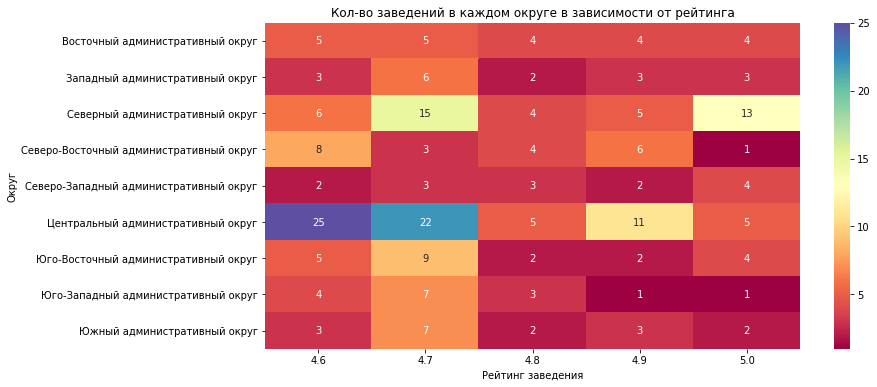

In [51]:
#построим тепловую карту
plt.figure(figsize=(12, 6))
sns.heatmap(pivot, annot=True, cmap='Spectral')
plt.title('Кол-во заведений в каждом округе в зависимости от рейтинга')
plt.xlabel('Рейтинг заведения')
plt.ylabel('Округ')
plt.show()

**В Северном, Юго-Восточном и Центральном АО больше кофеен с высоким рейтингом (от 4.5 и выше)**. По графику распределения кофеен по административным округам известно, что очень много кофеен располагется в Центральном (1 место) и Северном (2 место) округах. Стоит обратить внимание на то, что довольно много кофеен Юго-Восточного АО имеют высокий рейтинг, несмотря на то, что по кол-ву кофеен в округе, он занимает далеко не первое место. Было бы неплохо изучить информацию о кофейнях этого округа подробнее.

На основе вышеописанных результатов анализа, в датасете кофейни по кол-ву стоят на 3 месте (1411 шт.). Больше всего кофеен расположено в Центральном АО. Самый высокий рейтинг у кофеен, расположенных в Центральном и Северном АО. Самый низкий рейтинг кофеен в Южном, Западном и Северо-Восточном АО. 

#### Есть ли круглосуточные кофейни?

In [52]:
#посчитаем кол-во круглосуточных и некруглосуточных кофеен
coffee_24_7 = coffee['is_24_7'].value_counts().reset_index()
coffee_24_7

,index,is_24_7
0,False,1338
1,True,58


In [53]:
#построим диаграмму
fig = go.Figure(data=[go.Pie(labels=coffee_24_7['index'], values=coffee_24_7['is_24_7'])])
fig.update_layout(title='Соотношение круглосуточных и некруглосуточных кофеен') 
fig.show()

Круглосуточных кофеен (58 шт.) намного меньше некруглосуточных (1338 шт.).

#### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [54]:
print('При открытии стоит ориентироваться на стоимость {} - {} ₽ за чашку капучино, так как это средняя цена по Москве.'\
      .format(int(coffee['middle_coffee_cup'].median()), int(coffee['middle_coffee_cup'].mean())))

При открытии стоит ориентироваться на стоимость 169 - 172 ₽ за чашку капучино, так как это средняя цена по Москве.


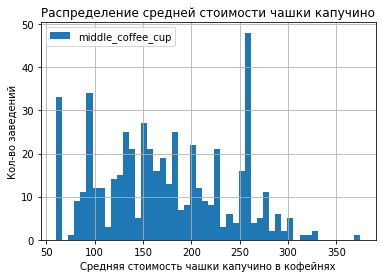

In [55]:
coffee.plot(title='Распределение средней стоимости чашки капучино', kind='hist', y='middle_coffee_cup', grid=True, bins=50)
plt.xlabel('Средняя стоимость чашки капучино в кофейнях')
plt.ylabel('Кол-во заведений')
plt.show()

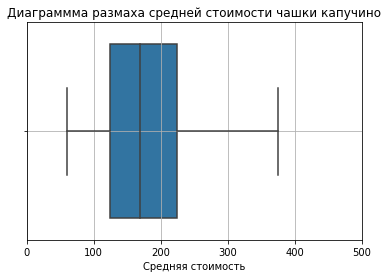

In [56]:
#построим ящик с усами для middle_coffee_cup
plt.figure()
sns.boxplot(x='middle_coffee_cup', data=coffee)
plt.title('Диаграммма размаха средней стоимости чашки капучино')
plt.xlabel('Средняя стоимость')
plt.grid()
plt.xlim([0, 500])
plt.show()

Выбросов в данных нет, медиана действительно находится в районе 170 рублей. Интересно, что у около 50 кофеен средняя стоимость чашки капучино составляет чуть больше 250 рублей.

#### Как кофейни распределяются по ценовым категориям?

In [57]:
#посчитаем кол-во кофеен каждой ценовой категории
coffee_price = coffee['price'].value_counts().reset_index()

#построим диаграмму
fig = go.Figure(data=[go.Pie(labels=coffee_price['index'], values=coffee_price['price'])])
fig.update_layout(title='Ценовые категории кофеен') 
fig.show()

Для кофеен характерны скорее средние и низкие ценовые категории. Намного реже можно встретить подобные заведения с высокой или выше среднего ценовой категорией.

#### Сколько в среднем посадочных мест в кофейнях?

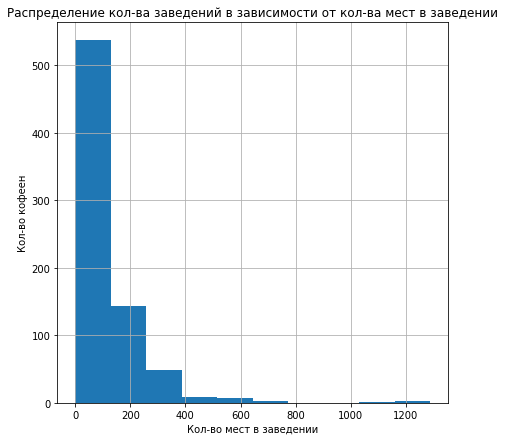

count     749.000000
mean      111.165554
std       127.946510
min         0.000000
25%        40.000000
50%        80.000000
75%       144.000000
max      1288.000000
Name: seats, dtype: float64

In [58]:
#построим график распределения кол-ва кофеен в зависимости от кол-ва посадочных мест
plt.figure(figsize=(7, 7))
coffee['seats'].plot(title='Распределение кол-ва заведений в зависимости от кол-ва мест в заведении',\
                     kind='hist', grid=True)
plt.xlabel('Кол-во мест в заведении')
plt.ylabel('Кол-во кофеен')
plt.show()

coffee['seats'].describe()

Чаще всего в кофейнях около 80-100 посадочных мест. Кофеен с большим кол-вом мест намного меньше.

#### Топ-15 улиц с самой высокой средней ценой чашки кофе и с самыми высокими средними рейтингами

In [59]:
#выявим сначала топ-15 улиц с самой высокой средней ценой чашки кофе
street_coffee = coffee.groupby('street')['middle_coffee_cup'].mean().reset_index()\
                                .sort_values(by='middle_coffee_cup', ascending=False).head(15)
street_coffee

,street,middle_coffee_cup
88,Большая Никитская улица,328.0
40,3-я Фрунзенская улица,320.0
96,Большая Сухаревская площадь,300.0
83,Богословский переулок,300.0
32,3-й Крутицкий переулок,291.0
465,площадь Победы,291.0
519,улица Гарибальди,291.0
244,Милютинский переулок,290.0
156,Енисейская улица,287.0
384,Стремянный переулок,285.0


In [60]:
#построим столбчатую диаграмму
plt.figure(figsize=(10, 8))
fig = px.bar(street_coffee, x='middle_coffee_cup', y='street', orientation='h')

fig.update_layout(title='Топ-15 улиц с самой высокой средней ценой чашки кофе',
                   xaxis_title='Средняя цена чашки кофе',
                   yaxis_title='Улица',
                   width=1000, # указываем размеры графика
                   height=400)
fig.show()

<Figure size 720x576 with 0 Axes>

Самая высокая средняя цена за чашку кофе у заведений, расположенных на улицах Большая Никитская и 3-я Фрунзенская. Самая низкая средняя цена в топе-15 у кофеен, расположенных на улицах Серпуховский Вал, Охотный Ряд, и на Спиридоньевском и Лаврушинском переулках.

In [61]:
#определим теперь топ-15 улиц с самыми высокими средними рейтингами кофеен
coffee_rat = round(coffee.groupby('street')['rating'].mean(), 2).reset_index()\
                            .sort_values(by='rating', ascending=False).head(16)
coffee_rat

,street,rating
160,Западный административный округ,5.00
39,3-я Радиаторская улица,5.00
36,3-й Силикатный проезд,5.00
223,Лубянский проезд,5.00
390,Суздальская улица,5.00
24,2-я Кабельная улица,5.00
273,Никулинская улица,5.00
486,улица Академика Арцимовича,5.00
352,Светлогорский проезд,5.00
605,улица Сретенка,4.95


Самым первым в списке улиц стоит Западный АО. В столбец с названиями улиц это значение попало, поскольку у некоторых заведений в адресе указан только округ и район расположения заведения. Не будем брать в расчет рейтинг этого значения, т.к. нам нужны средние рейтинги именно улиц.

In [62]:
#уберем значение "Западный административный округ" из coffee_rat
coffee_rat = coffee_rat.query('street != "Западный административный округ"')

#построим столбчатую диаграмму
plt.figure(figsize=(10, 8))
fig = px.bar(coffee_rat, x='rating', y='street', orientation='h')

fig.update_layout(title='Топ-15 улиц с самыми высокими средними рейтингами кофеен',
                   xaxis_title='Средний рейтинг',
                   yaxis_title='Улица',
                   width=1000, # указываем размеры графика
                   height=400)
fig.show()

<Figure size 720x576 with 0 Axes>

Самые высокие рейтинги (5.0) наблюдаются у заведений сразу нескольких улиц: 
- 3-я Радиаторская улица
- 3-й Силикатный проезд
- Лубянский проезд
- Суздальская улица
- 2-я Кабельная улица
- Никулинская улица
- улица Академика Арцимовича
- Светлогорский проезд

In [63]:
#посмотрим в каких округах находятся кофейни из coffee_rat
coffee_rat = coffee_rat['street']
coffee_rat_data = coffee.query('street in @coffee_rat')
coffee_rat_data.groupby('district')['street'].nunique().reset_index().sort_values(by='street', ascending=False)

,district,street
5,Центральный административный округ,3
0,Восточный административный округ,2
2,Северный административный округ,2
4,Северо-Западный административный округ,2
7,Юго-Западный административный округ,2
1,Западный административный округ,1
3,Северо-Восточный административный округ,1
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [64]:
#посмотрим какие улицы принадлежат ЦАО
coffee_rat_data[coffee_rat_data['district'] == "Центральный административный округ"]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
4408,Bodrero,кофейня,"Москва, улица Сретенка, 9",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.767602,37.631515,5.0,NaN,NaN,-1.0,NaN,1,28.0,улица Сретенка,False
4411,За Думой,кофейня,"Москва, Лубянский проезд, 5, стр. 1",Центральный административный округ,"пн-пт 10:00–22:00; сб,вс 12:00–22:00",55.758780,37.629375,5.0,средние,NaN,-1.0,NaN,0,80.0,Лубянский проезд,False
4526,Эклерная Клер,кофейня,"Москва, улица Сретенка, 26/1",Центральный административный округ,"ежедневно, 09:00–21:00",55.770519,37.633358,4.9,NaN,NaN,-1.0,NaN,0,45.0,улица Сретенка,False
4841,Моремэй,кофейня,"Москва, Абельмановская улица, 7",Центральный административный округ,"ежедневно, 09:00–23:00",55.736198,37.671710,4.9,NaN,Цена чашки капучино:99–200 ₽,-1.0,149.0,0,0.0,Абельмановская улица,False


Больше всего улиц с самым высоким средним рейтингом находятся в ЦАО: улица Сретенка, Лубянский проезд и Абельмановская улица.

### Общий вывод

В рамках данного исследования был изучен рынок Москвы с целью помочь инвесторам в будущем с выбором подходящего места для вложений за счет подробного изучения интересных особенностей и закономерностей рынка Москвы.

**Цель исследования** состояла в выявлении закономерностей, определяющих прибыльность заведений общественного питания.

**Этап 1. Изучение и предобработка данных**

На этапе предобработки были произведены:

* В столбцах `hours`, `avg_bill`, `price`, `middle_coffee_cup` и `seats` пропуски было принято решение оставить для того, чтобы не исказить данные. Пропуски в `middle_avg_bill` были заполнены.

* Добавлены столбцы: `street` с названиями улиц из столбца с адресом и `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

* В данных присутствуют дубликаты, но они были оставлены как есть.

* Были подробно изучены столбцы `middle_avg_bill`, `middle_coffee_cup`, `seats`, `rating` на наличие выбросов. Обнаружены следующие аномалии:
1. Минимальный средний чек составил 0 рублей. 
2. Максимальная средняя стоимость чашки капучино составила 1568 рублей. 
3. Средние чеки, превышающие стоимость в 2500 рублей.

Они были устранены.

**Этап 2. Анализ данных**

На данном этапе была описана и визуализирована общая информация о рынке Москвы:

* **Категории заведений в данных**

Всего в данных **8 категорий заведений**, которые распределены следующим образом: 

1. Кафе (2373 заведений).

2. Ресторан (1964).

3. Кофейня (1411).

4. Бар, паб (753).

5. Пиццерия (629).

6. Быстрое питание (600).

7. Столовая (314).

8. Булочная (256).

Чаще всего можно встретить кафе, рестораны и кофейни. Гораздо реже встречаются столовые и булочные.

* **Количество посадочных мест в местах по категориям**

Больше всего посадочных мест у ресторанов, баров/пабов и кофеен. Меньше всего их у пиццерий и булочных.

* **Соотношение сетевых и несетевых заведений в датасете**

Несетевых заведений в данных значительно больше, чем сетевых.

* **Какие категории заведений чаще являются сетевыми?**

Чаще всего сетевыми являются заведения категорий: **булочная, пиццерия и кофейня**. Меньше всего сетевых заведений наблюдается среди столовых и баров/пабов.

* **Топ-15 популярных сетей в Москве**

Из топа 15 самых популярных сетей в Москве наибольшей популярностью пользуются: ***Шоколадница, Домино'c Пицца*** и ***Додо Пицца***. Категории этого топа распределились следующим образом:

1. Кафе (36.93%).

2. Пиццерия (16.44%).

3. Ресторан (14.48%).

4. Бар/паб (14.11%).

5. Кофейня (8.71%).

6. Быстрое питание (5.4%)

7. Булочная (3.93%)

* **Какие административные районы Москвы присутствуют в датасете?**

В датасете присутствуют ***9 административных округов*** (АО). Больше всего заведений расположено в Центральном округе. Можно отметить, что в каждом округе популярны кафе, кофейни и рестораны. В Центральном округе также очень популярны бары и пабы. 

* **Распределение средних рейтингов по категориям заведений**

Усреднённые рейтинги не сильно различаются в разных типах общепита. Выше всего рейтинг у баров и пабов, ниже всего - у заведений быстрого питания.

* **Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района**

Самый высокий рейтинг у заведений Центрального АО, в то время как самый низкий у Юго-Восточного АО.

* **Топ-15 улиц по количеству заведений**

Меньше всего заведений расположено на Пятницкой улице, больше всего - на проспекте Мира, Профсоюзной улице, на проспекте Вернадского и Ленинском проспекте.

* **Улицы, на которых находится только один объект общепита**

Количество улиц, на которых находится только 1 объект общепита: 458. Улицы, на которых находится только один объект общепита зачастую весьма короткие по протяженности. Заведения на этих улицах расположены на окраинах районов или в переулках, где, скорее всего, низкая проходимость.

* **Фоновая картограмма (хороплет) ценового индикатора каждого района**

Как и ожидалось, самый большой чек выходит в Центральном АО (1000 рублей). Самый маленький чек - в Юго-Восточном АО (434 рубля). Важно отметить, что кол-во заведений в каждом округе довольно сильно разнится, а это может оказывать влияние на величину среднего чека.

* **Анализ цен в центральном административном округе и других, влияние удалённости от центра на цены в заведениях**

*Высокая ценовая категория:* Центральный АО.

*Выше среднего цен. категория:* Центральный и Западный АО.

*Средняя ценовая категория:* Центральный, Южный, Северный и Северно-Восточный АО.

*Низкая ценовая категория:* Центральный АО, Южный и Северо-Восточный АО. 

Таким образом, можно сделать вывод, что:
1. В Центральном АО действительно расположено больше всего заведений.
2. ***Чем ближе заведение к центру Москвы, тем вероятнее то, что его ценовая категория будет выше, и наоборот.***

**Этап 3. Детализируем исследование: открытие кофейни**

Основатели фонда «Shut Up and Take My Money» захотели открыть в Москве прибыльную и доступную кофейню. На последнем этапе исследования были проанализированы кофейни Москвы, чтобы определить, насколько осуществима задумка клиентов.

На основе выявленных закономерностей, можно сформулировать следующие рекомендации:

* Известно, что в Москве кофейни по кол-ву стоят на 3 месте. **Больше всего кофеен расположено в Центральном АО**, меньше всего кофеен в Северо-Западном АО. Вероятнее всего самым лучшим решением будет открыть кофейню в Центральном АО, поскольку там всегда высокий спрос.

* Самый низкий рейтинг у тех кофеен, что находятся в Южном, Западном и Северо-Восточном АО, поэтому не стоит ориентироваться на открытии заведения в этих округах. 

* В Северном, Юго-Восточном и Центральном АО больше кофеен с высоким рейтингом (от 4.5 и выше). Стоит обратить внимание на то, что довольно много кофеен **Юго-Восточного АО** имеют высокий рейтинг, несмотря на то, что по кол-ву кофеен в округе, он занимает далеко не первое место. Этот округ тоже можно рассматривать, как возможное место открытия кофейни.

* Круглосуточных кофеен намного меньше некруглосуточных. Можно предположить, что **круглосуточные кофейни пользуются меньшим спросом** потому, что среди покупателей мало желающих пить кофе ночью.

* Для большинства кофеен характерны **средние и низкие ценовые категории**, поэтому было бы оптимально установить соответствующие цены в новом заведении. Намного реже встречаются кофейни с высокой или выше среднего ценовой категорией.

* При открытии стоит ориентироваться на стоимость **169 - 172 ₽ за чашку капучино**, так как это средняя цена по Москве, т.е. конкурентноспособная в условиях рынка и доступная для покупателей.

* На основе проведенного анализа можно порекомендовать спроектировать кофейню **примерно на 80-100 посадочных мест**. Кофеен с большим кол-вом мест намного меньше.

* Самая высокая средняя цена за чашку кофе у заведений, расположенных на **улицах Большая Никитская и 3-я Фрунзенская**. Самая низкая средняя цена в топе-15 улиц с самой высокой средней ценой за чашку кофе у кофеен, расположенных на улицах Серпуховский Вал, Охотный Ряд, и на Спиридоньевском и Лаврушинском переулках.

* **Самые высокие рейтинги (5.0) наблюдаются у кофеен, расположенных на сразу нескольких улицах**: 
- 3-я Радиаторская улица
- 3-й Силикатный проезд
- Лубянский проезд
- Суздальская улица
- 2-я Кабельная улица
- Никулинская улица
- улица Академика Арцимовича
- Светлогорский проезд

Больше всего улиц с самым высоким средним рейтингом находятся в ЦАО: улица Сретенка, Лубянский проезд и Абельмановская улица. Их можно рекомендовать в качестве возможных вариантов расположения новой кофейни.

### Презентация


https://drive.google.com/file/d/1GWtBFDmr6UmkFdtcjcUZUzj8BSTMxqr3/view?usp=sharing